# COURSE: A deep understanding of deep learning
## SECTION: ANNs
### LECTURE: CodeChallenge: more qwerties!
#### TEACHER: Mike X Cohen, sincxpress.com
##### COURSE URL: udemy.com/course/deeplearning_x/?couponCode=202305

In [1]:
import matplotlib.pyplot as plt
import matplotlib_inline.backend_inline
# import libraries
import numpy as np
import torch
import torch.nn as nn
from rich import print

matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# Import and process the data

In [2]:
# create data

nPerClust = 100
blur = 1

A = [1, 1]
B = [5, 1]
C = [3, -2]

# generate data
a = [A[0] + np.random.randn(nPerClust) * blur, A[1] + np.random.randn(nPerClust) * blur]
b = [B[0] + np.random.randn(nPerClust) * blur, B[1] + np.random.randn(nPerClust) * blur]
c = [C[0] + np.random.randn(nPerClust) * blur, C[1] + np.random.randn(nPerClust) * blur]

# true labels
labels_np = np.vstack((
    np.zeros((nPerClust, 1)),
    np.ones((nPerClust, 1)),
    2 * np.ones((nPerClust, 1))
))

# concatanate into a matrix
data_np = np.hstack((a, b, c)).T

print(f'labels_np shape: {labels_np.shape}')
print(f'data_np shape: {data_np.shape}')
print(f'labels_np:\n {labels_np[:5]}...')
print(f'data_np:\n {data_np[:5]}...')

# convert to a pytorch tensor
# data = torch.tensor(data_np).float()
# labels = torch.squeeze(torch.tensor(labels_np).long())
# the squeeze function removes dimensions of size 1 from the shape of a tensor 
#   ie.: [[1], [2], [3]] -> [1, 2, 3]  (shape: (3, 1) -> (3,))  
#   [[[1, 2, 3]]] -> [1, 2, 3]  (shape: (1, 3) -> (3,))


labels_np shape: (300, 1)

data_np shape: (300, 2)

labels_np:
 [[0.]
 [0.]
 [0.]
 [0.]
 [0.]]...

data_np:
 [[0.70973928 0.92951724]
 [1.851757   1.85316738]
 [1.8334563  1.35051176]
 [0.98869756 2.56783501]
 [0.15047792 1.49623552]]...

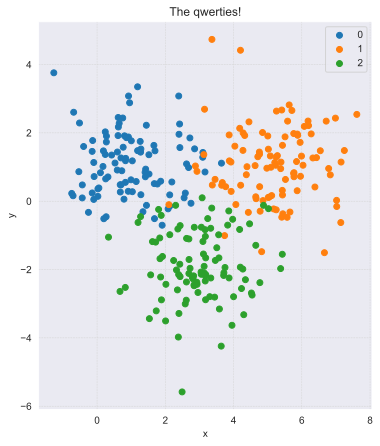

labels shape: torch.Size([300, 1])

data shape: torch.Size([300, 2])

labels:
 tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]])...

data:
 tensor([[ 1.7675,  0.5032],
        [ 2.0814, -0.2235],
        [ 3.1636,  0.8557],
        [ 1.6656,  1.6338],
        [ 0.2516,  0.6536]])...

In [3]:
# using myUtils library to generate data
import sys

sys.path.append('../myUtils')
from myUtils.rndData import createData

nPerClust = 100
blur = 1

A = [1, 1]
B = [5, 1]
C = [3, -2]

# generate data
data, labels, clusters = createData(nPerClust, locations=[A, B, C], blur=blur, title='The qwerties!',
                                    figsize=(7, 7), plot=True)
print(f'labels shape: {labels.shape}')
print(f'data shape: {data.shape}')
print(f'labels:\n {labels[:5]}...')
print(f'data:\n {data[:5]}...')


In [4]:
# print clusters (clusters: list of clusters, each cluster is a list of 2 lists (x and y coordinates))
for ci, cluster in enumerate(clusters):
    print(f'cluster {ci}:')
    for i, xy in enumerate(cluster):
        print(f'  {"x" if i == 0 else "y"}: {xy[:5]}...')


cluster 0:

x: tensor([1.7675, 2.0814, 3.1636, 1.6656, 0.2516])...

y: tensor([ 0.5032, -0.2235,  0.8557,  1.6338,  0.6536])...

cluster 1:

x: tensor([4.0384, 6.6633, 5.6299, 2.8820, 5.0033])...

y: tensor([ 1.6115, -1.5069,  2.8186,  1.0305,  1.9088])...

cluster 2:

x: tensor([1.8375, 2.8299, 2.4249, 3.7171, 2.3673])...

y: tensor([-1.0759, -2.1850, -1.8443, -2.0944, -0.8140])...

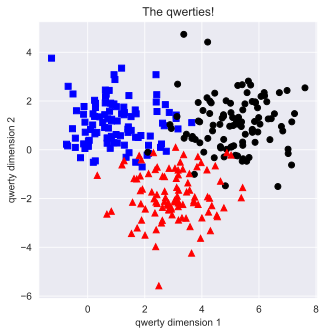

In [5]:
# show the data
fig = plt.figure(figsize=(5, 5))
plt.plot(data[np.where(labels == 0)[0], 0], data[np.where(labels == 0)[0], 1], 'bs')
plt.plot(data[np.where(labels == 1)[0], 0], data[np.where(labels == 1)[0], 1], 'ko')
plt.plot(data[np.where(labels == 2)[0], 0], data[np.where(labels == 2)[0], 1], 'r^')
plt.title('The qwerties!')
plt.xlabel('qwerty dimension 1')
plt.ylabel('qwerty dimension 2')
plt.show()

# Create the ANN model

In [6]:
# model architecture
model = nn.Sequential(
    nn.Linear(2, 16),  # input layer
    nn.ReLU(),  # activation unit
    nn.Linear(16, 16),  # input layer
    nn.ReLU(),  # activation unit
    nn.Linear(16, 16),  # input layer
    nn.ReLU(),
    nn.Linear(16, 16),  # input layer
    nn.ReLU(),
    nn.Linear(16, 16),  # input layer
    nn.ReLU(),
    nn.Linear(16, 16),  # input layer
    nn.ReLU(),
    nn.Linear(16, 16),  # input layer
    nn.LogSigmoid(),  # activation unit
    nn.Linear(16, 64),  # input layer
    nn.LogSigmoid(),  # activation unit
    nn.Linear(64, 3),  # output units
    nn.Softmax(dim=1),  # final activation unit (see Additional Exploration #2 for a discussion about this)
)

# loss function
lossfun = nn.CrossEntropyLoss()

# optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=.01)

In [7]:
# test the model
yHat = model(data)

print(data.shape)
print(yHat.shape)

torch.Size([300, 2])

torch.Size([300, 3])

# Train the model

In [8]:
numepochs = 20000

# initialize losses
losses = torch.zeros(numepochs)
ongoingAcc = []
print(labels[:5])

# convert labels to long and squeeze to remove the extra dimension
labels = labels.long().squeeze()
print(labels[:5])

# TO use the GPU, send the model and data to the GPU:
model = model.to('cuda')
data = data.to('cuda')
labels = labels.to('cuda')

# loop over epochs
for epochi in range(numepochs):
    # forward pass
    yHat = model(data)

    # compute loss
    loss = lossfun(yHat, labels)
    losses[epochi] = loss
    
    # backprop
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # compute accuracy
    matches = torch.argmax(yHat, axis=1) == labels  # booleans (false/true)
    matchesNumeric = matches.float()  # convert to numbers (0/1)
    accuracyPct = 100 * torch.mean(matchesNumeric)  # average and x100 
    ongoingAcc.append(accuracyPct)  # add to list of accuracies

# final forward pass
predictions = model(data)

predlabels = torch.argmax(predictions, axis=1)
matches = predlabels == labels
totalacc = 100 * torch.mean(matches.float())

tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]])

tensor([0, 0, 0, 0, 0])

# Visualize the results

Final accuracy: 90.3333%

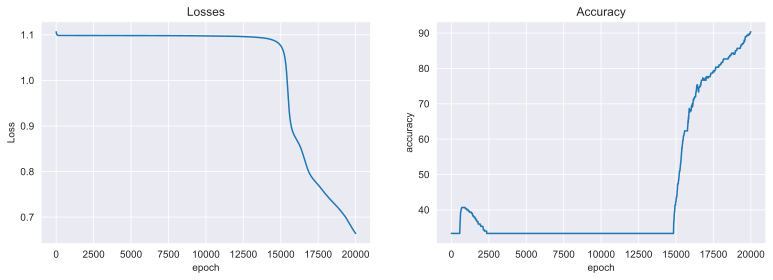

In [9]:
# report accuracy
print('Final accuracy: %g%%' % totalacc)

fig, ax = plt.subplots(1, 2, figsize=(13, 4))

ax[0].plot(losses.detach())
ax[0].set_ylabel('Loss')
ax[0].set_xlabel('epoch')
ax[0].set_title('Losses')

# ax[1].plot(ongoingAcc) --> TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.
ax[1].plot(torch.tensor(ongoingAcc).cpu())
ax[1].set_ylabel('accuracy')
ax[1].set_xlabel('epoch')
ax[1].set_title('Accuracy')
plt.show()

In [10]:
# confirm that all model predictions sum to 1
torch.sum(yHat, axis=1)[:10]

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000], device='cuda:0', grad_fn=<SliceBackward0>)

In [11]:
# copy tensor to cpu
yHat = yHat.cpu()

# pass through softmax to get probabilities
yHat = nn.functional.softmax(yHat, dim=1)
torch.sum(yHat, axis=1)[:10]

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000], grad_fn=<SliceBackward0>)

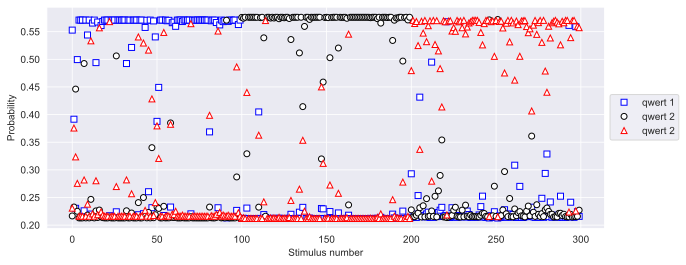

tensor([[0.5529, 0.2166, 0.2306],
        [0.3916, 0.2327, 0.3757],
        [0.2304, 0.4461, 0.3235],
        [0.4995, 0.2250, 0.2755],
        [0.5710, 0.2130, 0.2160],
        [0.5709, 0.2130, 0.2161],
        [0.5710, 0.2130, 0.2160],
        [0.2259, 0.4924, 0.2817],
        [0.5710, 0.2130, 0.2160],
        [0.5440, 0.2182, 0.2378],
        [0.5710, 0.2130, 0.2160],
        [0.2200, 0.2466, 0.5334],
        [0.5656, 0.2141, 0.2203],
        [0.5710, 0.2130, 0.2160],
        [0.4940, 0.2257, 0.2803],
        [0.5675, 0.2137, 0.2188],
        [0.2158, 0.2273, 0.5569],
        [0.5611, 0.2150, 0.2239],
        [0.5684, 0.2135, 0.2181],
        [0.5710, 0.2130, 0.2160],
        [0.5708, 0.2130, 0.2161],
        [0.5710, 0.2130, 0.2160],
        [0.2170, 0.2148, 0.5682],
        [0.5709, 0.2130, 0.2161],
        [0.5710, 0.2130, 0.2160],
        [0.5710, 0.2130, 0.2160],
        [0.2241, 0.5062, 0.2697],
        [0.5710, 0.2130, 0.2160],
        [0.5710, 0.2130, 0.2160],
        [0.5708, 0.2130, 0.2162],
        [0.5710, 0.2130, 0.2160],
        [0.5710, 0.2130, 0.2160],
        [0.4923, 0.2259, 0.2817],
        [0.5710, 0.2130, 0.2160],
        [0.5709, 0.2130, 0.2161],
        [0.5215, 0.2219, 0.2566],
        [0.5708, 0.2130, 0.2161],
        [0.5710, 0.2130, 0.2160],
        [0.5710, 0.2130, 0.2160],
        [0.2188, 0.2407, 0.5405],
        [0.5710, 0.2130, 0.2160],
        [0.5710, 0.2130, 0.2160],
        [0.2206, 0.2499, 0.5295],
        [0.5577, 0.2156, 0.2267],
        [0.5706, 0.2131, 0.2163],
        [0.2605, 0.2229, 0.5166],
        [0.5710, 0.2130, 0.2160],
        [0.2315, 0.3401, 0.4284],
        [0.5695, 0.2133, 0.2172],
        [0.5405, 0.2188, 0.2407]], grad_fn=<SliceBackward0>)

In [12]:
# plot the raw model outputs

fig = plt.figure(figsize=(10, 4))

colorshape = ['bs', 'ko', 'r^']
for i in range(3):
    plt.plot(yHat[:, i].detach(), colorshape[i], markerfacecolor='w')

plt.xlabel('Stimulus number')
plt.ylabel('Probability')
plt.legend(['qwert 1', 'qwert 2', 'qwert 2'], loc=(1.01, .4))
plt.show()
print(yHat[:50])

In [13]:
# plot the decision boundaries

# create a meshgrid of xy values
x = np.linspace(-20, 20, 1000)
y = np.linspace(-20, 20, 1000)
X, Y = np.meshgrid(x, y)

# convert to tensor
XY = torch.tensor(np.vstack((X.flatten(), Y.flatten())).T).float()
XY = XY.to('cuda')

# get model predictions
model.eval()
with torch.no_grad():
    modelPredictions = model(XY)

modelPredictions = modelPredictions.cpu()
# convert to probabilities
modelPredictions = nn.functional.softmax(modelPredictions, dim=1)

# move back to CPU for plotting
modelPredictions = modelPredictions.cpu().numpy()

# move data and labels to CPU for plotting
data_cpu = data.cpu()
labels_cpu = labels.cpu()

# plot the data
fig = plt.figure(figsize=(12, 12))
for i in range(3):
    plt.contourf(X, Y, modelPredictions[:, i].reshape(1000, 1000), alpha=0.5, levels=50)
    plt.scatter(data_cpu[np.where(labels_cpu == i)[0], 0], data_cpu[np.where(labels_cpu == i)[0], 1], edgecolors='k',
            marker='o')

# scatter plot the errors (if any) with large red X
errors = np.where(predlabels.cpu() != labels_cpu)[0]
plt.scatter(data_cpu[errors, 0], data_cpu[errors, 1], s=200, facecolors='r', marker='x')

plt.title('Decision boundaries')
plt.xlabel('qwerty dimension 1')
plt.ylabel('qwerty dimension 2')
plt.show()


# Additional explorations

In [14]:
# 1) Does the model always do well? Re-run the entire notebook multiple times and see if it always reaches high accuracy
#    (e.g., >90%). What do you think would be ways to improve the performance stability of the model?
# 
# 2) You'll learn in the section "Metaparameters" that CrossEntropyLoss computes log-softmax internally. Does that mean 
#    that the Softmax() layer in the model needs to be there? Does it hurt or help? If you remove that final layer, what
#    would change and what would be the same in the rest of the notebook?
#    (Note about this problem: If it feels too advanced, then revisit this problem after the "Metaparameters" section.)
# 